In [1]:
import pandas as pd
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt

In [2]:
data = pd.read_csv('../w_obj_detection_tracking/walmart_labels.csv')
data.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,frame_00808.png,1920,2560,cart,0,1346,861,2503
1,frame_00808.png,1920,2560,head,455,865,797,1236
2,frame_00808.png,1920,2560,person,304,861,1172,2378
3,frame_00785.png,1920,2560,cart,0,1331,865,2503
4,frame_00785.png,1920,2560,head,440,865,763,1236


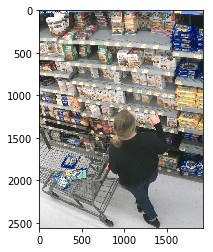

Image shape-> (2560, 1920, 3)


In [3]:
## Perform some sanity check on bounding boxes to make sure they are right
%matplotlib inline
img = cv2.cvtColor(cv2.imread('../../vid.alegion.com/data/src/20181021/181016_55.254.1.19_4184test_12/frames/frame_00211.png'),cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()
print("Image shape-> {}".format(img.shape))



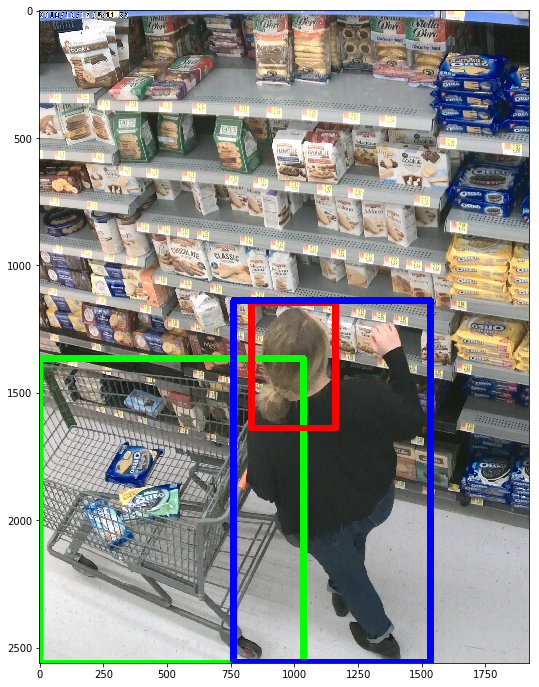

In [4]:
cv2.rectangle(img, (0,1365), (1036, 2560), (0,255,0), 25)
cv2.rectangle(img, (831,1145), (1161, 1638), (255,0,0), 25)
cv2.rectangle(img, (763,1138), (1533, 2556), (0,0,255), 25)
plt.figure(figsize=(15,12))
plt.imshow(img)
plt.show()

In [125]:
def draw_boxes(image_name):
    selected_value = data[data.filename == image_name]
    print(selected_value)
    img = cv2.cvtColor(cv2.imread('../../vid.alegion.com/data/src/20181021/181016_55.254.1.19_4184test_12/frames/{}'.format(image_name)),cv2.COLOR_BGR2RGB)
    color = [(0,255,0),(255,0,0),(0,0,255)]
    color_idx = 0
    for index, row in selected_value.iterrows():
        img = cv2.rectangle(img, (row['xmin'], row['ymin']), (row['xmax'], row['ymax']), color[color_idx],25)
        cv2.putText(img, row['class'], (int(row['xmin']),int(row['ymin'])-50),
                        cv2.FONT_HERSHEY_SIMPLEX,3, color[color_idx], 5)
        color_idx+=1
    return img

In [126]:
from PIL import Image

           filename  width  height   class  xmin  ymin  xmax  ymax
18  frame_00664.png   1920    2560    cart     4  1339   839  2507
19  frame_00664.png   1920    2560    head   360  1100   653  1585
20  frame_00664.png   1920    2560  person   357  1100  1051  2401


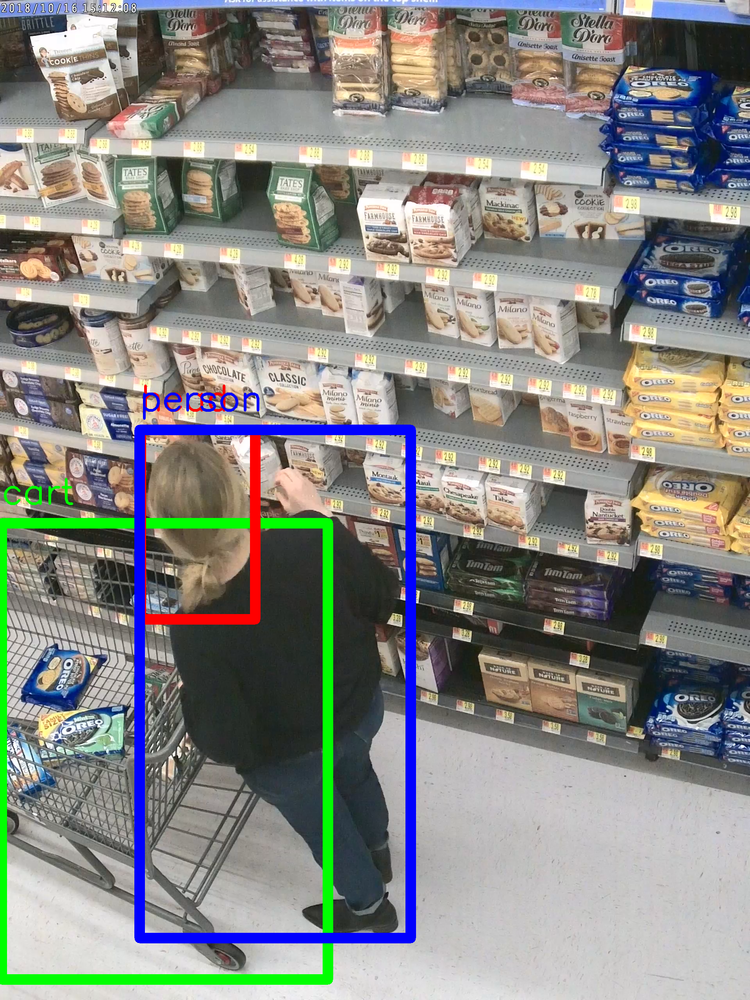

In [127]:
Image.fromarray(draw_boxes('frame_00664.png'))

Empty DataFrame
Columns: [filename, width, height, class, xmin, ymin, xmax, ymax]
Index: []


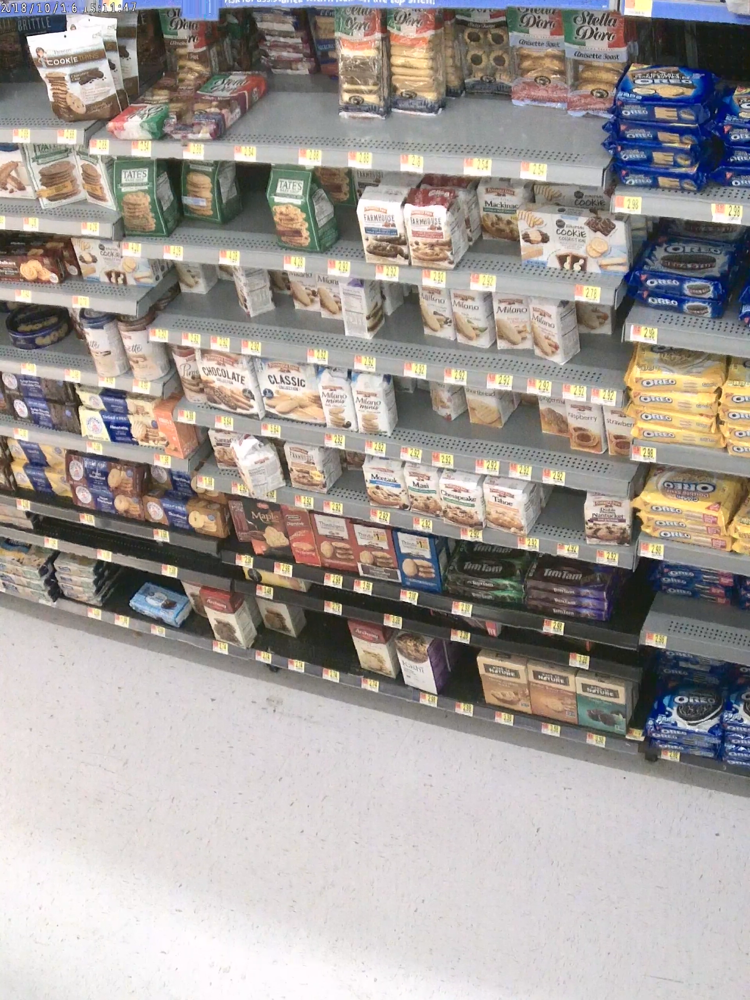

In [53]:
Image.fromarray(draw_boxes('frame_00025.png'))

In [70]:
df_filenames = data['filename'].values

In [78]:
all_unique_filenames = list(set(list(df_filenames)))

In [80]:
len(all_unique_filenames)

880

In [81]:
all_unique_filenames


['frame_00667.png',
 'frame_00730.png',
 'frame_00617.png',
 'frame_00537.png',
 'frame_00452.png',
 'frame_00170.png',
 'frame_00957.png',
 'frame_00777.png',
 'frame_00869.png',
 'frame_00290.png',
 'frame_00943.png',
 'frame_00529.png',
 'frame_00138.png',
 'frame_00540.png',
 'frame_00813.png',
 'frame_00989.png',
 'frame_00920.png',
 'frame_00811.png',
 'frame_00144.png',
 'frame_00477.png',
 'frame_00295.png',
 'frame_00127.png',
 'frame_00158.png',
 'frame_00362.png',
 'frame_00649.png',
 'frame_00807.png',
 'frame_00754.png',
 'frame_00576.png',
 'frame_00941.png',
 'frame_00896.png',
 'frame_00385.png',
 'frame_00974.png',
 'frame_00713.png',
 'frame_00839.png',
 'frame_00977.png',
 'frame_00608.png',
 'frame_00762.png',
 'frame_00356.png',
 'frame_00734.png',
 'frame_00884.png',
 'frame_00628.png',
 'frame_00267.png',
 'frame_00384.png',
 'frame_00439.png',
 'frame_00459.png',
 'frame_00353.png',
 'frame_00888.png',
 'frame_00129.png',
 'frame_00887.png',
 'frame_00983.png',


In [138]:

import os
import csv

In [133]:
print("Length of train set --> {}".format(len(train_filenames)))
print("Length of test set --> {}".format(len(test_filenames)))

Length of train set --> 748
Length of test set --> 132


In [134]:
train_filenames[3]


'frame_00290.png'

In [135]:
test_filenames[3]

'frame_00133.png'

In [136]:
def split_into_train_test(input_dir,output_dir):
    if not os.path.isdir(input_dir):
        print("Input directory--> {} is not valid.".format(input_dir))
        return -1
    else:
        print("Input directory is present")
        df = pd.read_csv(input_dir)
        filenames = list(set(list(['filename'].values)))
        print("Input directory has {} unique labels".format(len(filenames)))
        filenames.sort()
        np.random.seed(230)
        print("Shuffling dataset")
        np.random.shuffle(filenames)
        print("Perform train {}%  and test {}% split".format(int(85),int(15)))
        split = int(0.85 * len(filenames))
        train_filenames = filenames[:split]
        test_filenames = filenames[split:]
        print("Length of train set --> {}".format(len(train_filenames)))
        print("Length of test set --> {}".format(len(test_filenames)))

        if not os.path.isdir(output_dir):
            print("Output dir not present..creating it")
            os.makedirs(output_dir)
            
        # Start reading the csv files to copy each row of associated filename to train and test accordingly
        
            
        


SyntaxError: invalid syntax (<ipython-input-136-49b4f8097429>, line 1)

In [160]:
def generate_train_test_csv(input_dir,output_dir,train_filenames):
    with open(os.path.join(input_dir,'walmart_labels.csv'), mode='rb') as csv_file_in,open(os.path.join(output_dir,'train_labels.csv')) as csv_train,open(os.path.join(output_dir,'test_labels.csv')) as csv_test:
        csv_reader = csv.DictReader(csv_file_in)
        csv_train_write = csv.DictWriter(csv_)
        line_count = 0
        for row in csv_reader:
            if line_count == 0:
                print(f'Column names are {", ".join(row)}')
                line_count += 1
            elif line_count > 5:
                break
            else:
                print("Checking if {} is in train_set".format(row["filename"]))
                if row["filename"] in train_filenames:
                      print("yes")
                else:
                    print("No")
            line_count += 1
        print(f'Processed {line_count} lines.')

In [161]:
input_dir = "../../vid.alegion.com/resize_raw/"
output_dir = "../../vid.alegion.com/resize_raw/"

In [162]:
generate_train_test_csv(input_dir, output_dir,train_filenames)


Column names are filename, width, height, class, xmin, ymin, xmax, ymax
Checking if frame_00808.png is in train_set
yes
Checking if frame_00808.png is in train_set
yes
Checking if frame_00785.png is in train_set
No
Checking if frame_00785.png is in train_set
No
Processed 6 lines.


In [164]:
import csv

with open('employee_file.csv', mode='w') as employee_file:
    employee_writer = csv.writer(employee_file, delimiter=',', quotechar='"', quoting=csv.QUOTE_MINIMAL)

    employee_writer.writerow(['John Smith', 'Accounting', 'November'])
    employee_writer.writerow(['Erica Meyers', 'IT', 'March'])